# Image Segmentation

The main objectives of this module are:

* Use & compare different methods of segmentation:
    * Histogram-based
    * Texture-based
    * Region growing
* Detect objects and extract object features.
* Understand corner detection and basic object recognition

## 1. Histogram segmentation

In histogram segmentation, we make the hypothesis that the histogram is composed of distinct separable distributions, and we try to find the best threshold to separate those distributions.

The code below uses a default threshold of 127 to segment the image. Modify it to:

1. Create a function to compute the optimal threshold for an 8 bit image. Apply on the cameraman image.
1. Compute the Otsu threshold for an 8-bit image, by optimizing within variance or inter-class variance for each possible theshold *t*. See [here](http://nbviewer.jupyter.org/github/odebeir/info-h-500-501/blob/ver_2016-2017/04-Image%20segmentation/01-Histogram%20based%20image%20segmentation.ipynb) how to compute the Otsu threshold.

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from skimage.io import imread, imshow

def manual_threshold(im, T):
    return im>T

def optimal_threshold(h, t):
    h1 = h[:t]
    h2 = h[t:]

    m1 = (h1 * np.arange(0, t)).sum()/h1.sum()
    m2 = (h2 * np.arange(t, len(h))).sum()/h2.sum()

    t2 = int(np.round((m1 + m2)/2))

    if t2 != t : return optimal_threshold(h, t2)
    return t2
    
def otsu_threshold(h):
    h = h*1./h.sum() # Probability histogram

    # Check every possible threshold
    var_within = np.zeros(len(h))
    var_between = np.zeros(len(h))
    sep = np.zeros(len(h))

    for t in range(1,len(h)-1):
        # Class probabilities
        w1 = h[:t].sum()
        w2 = h[t:].sum()
        # Class means
        m1 = (np.arange(0,t)*h[:t]).sum()/w1
        m2 = (np.arange(t,len(h))*h[t:]).sum()/w2
        # Class variances
        s1 = (((np.arange(0,t)-m1)**2)*h[:t]).sum()/w1
        s2 = (((np.arange(t,len(h))-m2)**2)*h[t:]).sum()/w2
        # Intra-class
        sw = w1*s1+w2*s2
        # Inter-class
        sb = w1*w2*((m2-m1)**2)
        # Separability
        var_within[t] = sw
        var_between[t] = sb

    sep[1:-1] = var_between[1:-1]/var_within[1:-1]
    best_t = np.argmax(sep)

    return best_t, var_within, var_between, sep

In [2]:
def plot_histogram_with_threshold(im, T):
    h = plt.hist(im.flatten(), bins=range(256))
    plt.plot([T,T],[0,h[0].max()], 'r-')

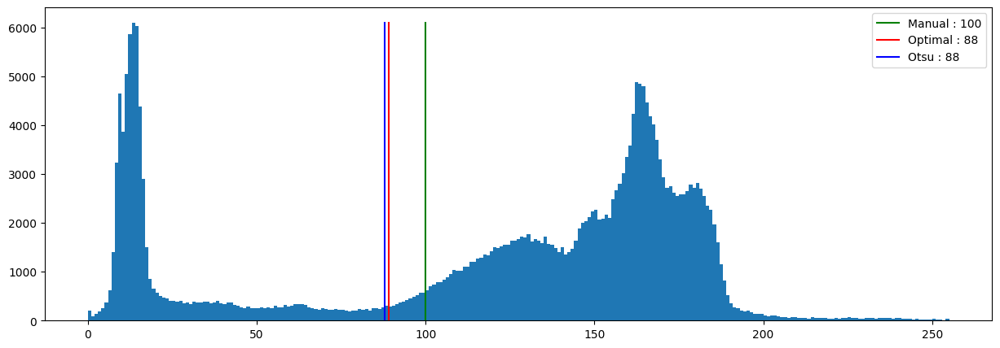

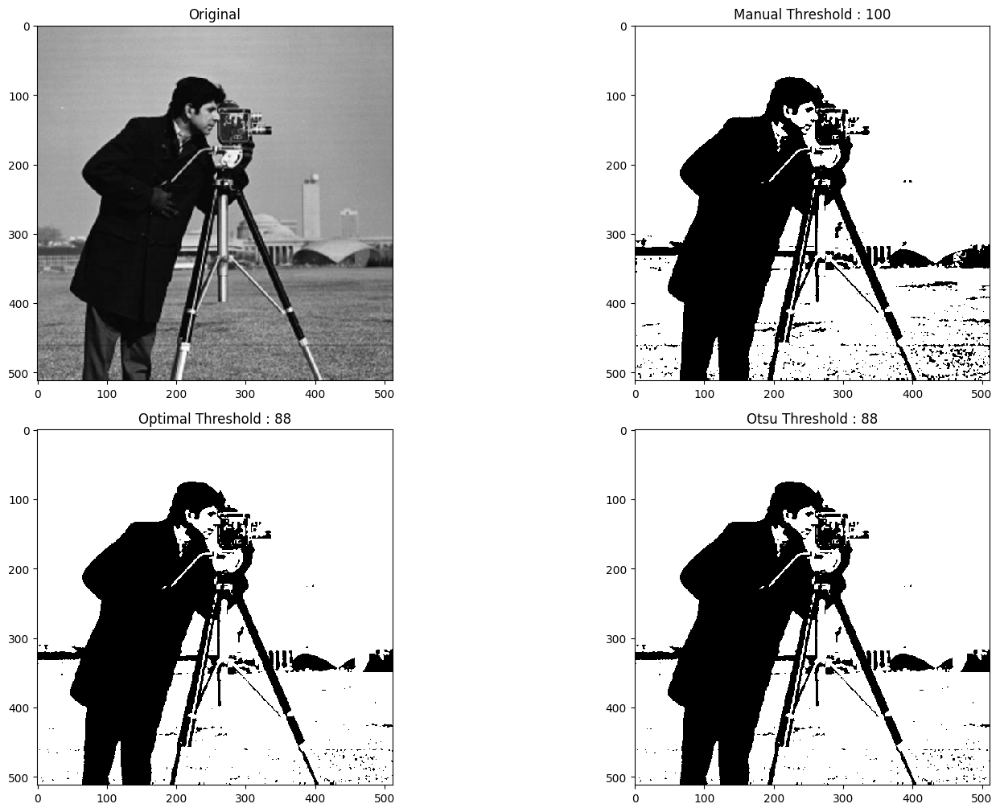

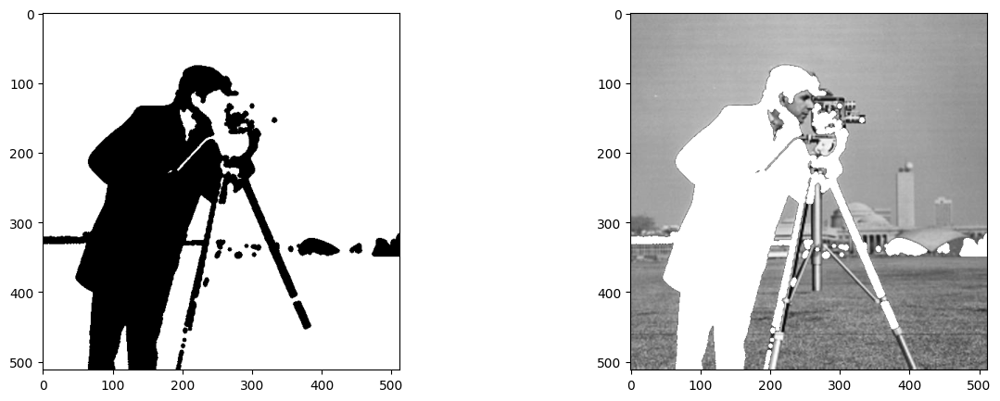

In [3]:
from skimage.color import rgb2hsv
from skimage.morphology import opening, closing, disk
from skimage.filters.rank import minimum,maximum

im = imread('camera.jpg')

# Manual Threshold
T = 100
manually_segmented = manual_threshold(im, T)

# Optimal Threshold
h, _ = np.histogram(im.flatten(),range(257))
OT = optimal_threshold(h, T)
optimaly_segmented = manual_threshold(im, OT)

# Otsu Threshold
h, bins = np.histogram(im.flatten(),range(257))
t,vw,vb,sep = otsu_threshold(h)
otsu_segmented = manual_threshold(im, t)

# Show original image & segmented binary image
def show_threshold():
    plt.figure(figsize=[15,5])
    h = plt.hist(im.flatten(), bins=range(256))
    plt.plot([T,T],[0,h[0].max()], 'g-', label=f"Manual : {T}")
    plt.plot([OT+1,OT+1],[0,h[0].max()], 'r-', label=f"Optimal : {OT}")
    plt.plot([t,t],[0,h[0].max()], 'b-', label=f"Otsu : {t}")
    plt.legend()
    plt.show()

def show_threshold_image():
    plt.figure(figsize=(15,15))
    plt.subplot(3,2,1)
    imshow(im)
    plt.title("Original")
    plt.subplot(3,2,2)
    imshow(manually_segmented)
    plt.title(f"Manual Threshold : {T}")
    plt.subplot(3,2,3)
    imshow(optimaly_segmented)
    plt.title(f"Optimal Threshold : {OT}")
    plt.subplot(3,2,4)
    imshow(otsu_segmented)
    plt.title(f"Otsu Threshold : {t}")
    plt.show()

    opening = minimum(maximum(otsu_segmented.astype('uint8'), disk(3)), disk(3))
    new = im.copy()
    new[opening == 0] = 255
    plt.figure(figsize=[15,5])
    plt.subplot(1,2,1)
    plt.imshow(opening, cmap=plt.cm.gray)
    plt.subplot(1,2,2)
    plt.imshow(new, cmap=plt.cm.gray)
    plt.show()

show_threshold()
show_threshold_image()

Threshold : 145


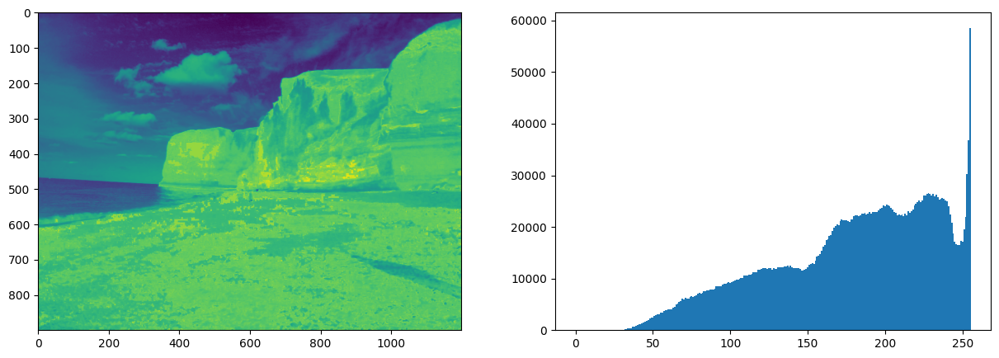

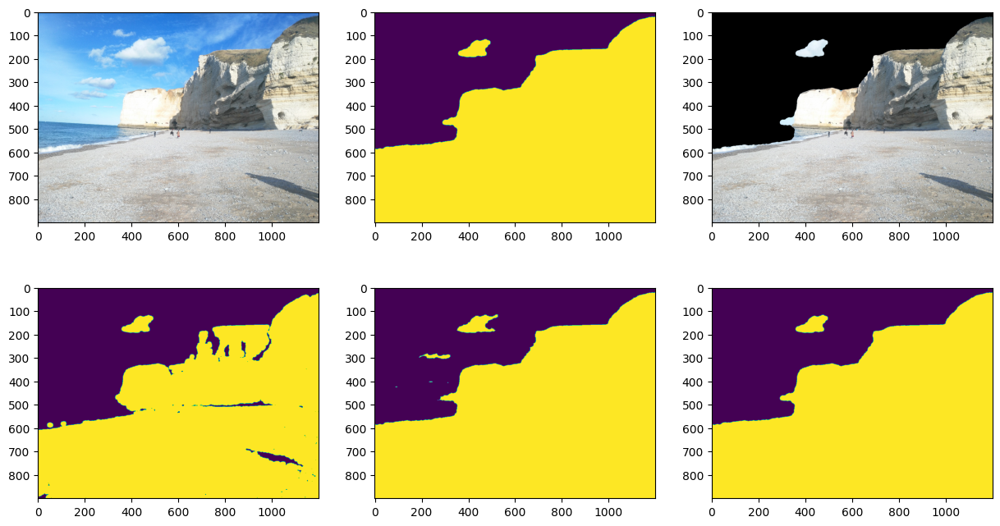

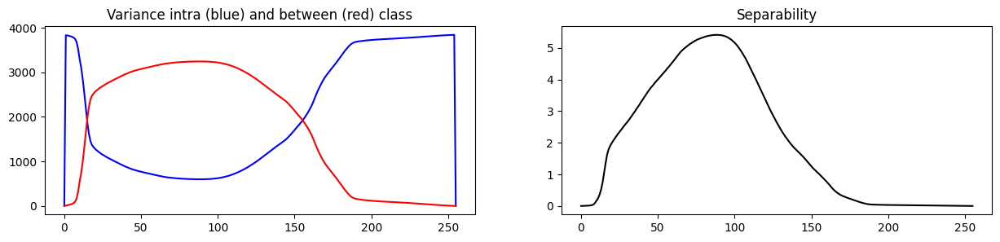

In [4]:
# Thresholding on color image
def distance_color_map(image, coords):
    refcolor = image[coords[0], coords[1]]
    dmap = np.sqrt(((image-refcolor)**2).sum(axis=2))
    return dmap

im = imread('etretat.jpg')
hsv = rgb2hsv(im)

coords = (10, 600)
dmap = distance_color_map(hsv.astype(float), coords)
h, bins = np.histogram(dmap.flatten(), bins=256)

b = optimal_threshold(h, T)
b = 145
print("Threshold :", b)

t = (bins[b] + bins[b+1])/2

mask = dmap>t
upgraded_mask = opening(closing(mask, disk(10)),disk(10))

im_m = im.copy()
im_m[upgraded_mask==False] = 0

def show():
    h, bins = np.histogram(im.flatten(),range(257))

    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    plt.imshow(dmap)
    plt.subplot(1,2,2)
    plt.bar(bins[:-1], h, bins[1] - bins[0])
    plt.show()

    plt.figure(figsize=(15,8))
    plt.subplot(2,3,1)
    plt.imshow(im)
    plt.subplot(2,3,2)
    plt.imshow(upgraded_mask)
    plt.subplot(2,3,3)
    plt.imshow(im_m)

    plt.subplot(2,3,4)
    plt.imshow(opening(mask, disk(10)))
    plt.subplot(2,3,5)
    plt.imshow(closing(mask, disk(10)))
    plt.subplot(2,3,6)
    plt.imshow(opening(closing(mask, disk(10)),disk(10)))
    plt.show()

    plt.figure(figsize=[15,3])
    plt.subplot(1,2,1)
    plt.plot(vw, 'b-')
    plt.plot(vb, 'r-')
    plt.title('Variance intra (blue) and between (red) class')
    plt.subplot(1,2,2)
    plt.plot(sep, 'k-')
    plt.title('Separability')
    plt.show()

show()

**Need more help? You can check the following videos:**

* [Manual thresholding](https://www.youtube.com/watch?v=rgKkws_fqz4&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=24)
* [Optimal threshold](https://www.youtube.com/watch?v=7B1cs0PARtg&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=25)
* [Otsu threshold](https://www.youtube.com/watch?v=mz26bssSLds&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=26)

## 2. Texture segmentation

Texture segmentation uses regional descriptors to segment the image based on the local texture. A simple algorithm is provided below, which:

* Extract neighborhoods with the sliding window method
* Compute the local maximum on the neighborhood and put it in a "descriptor" image
* Use Otsu thresholding on the descriptor image to segment it
* Display the results

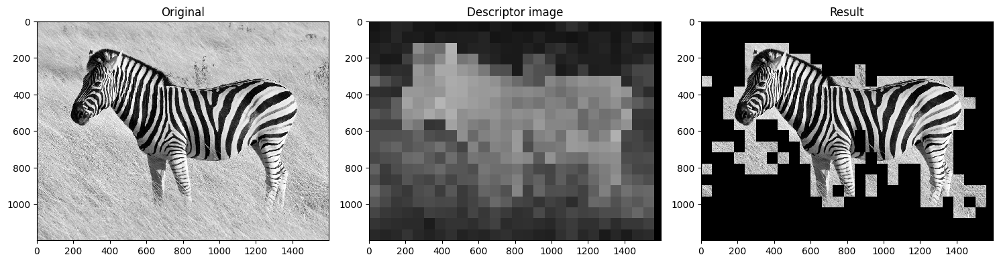

In [5]:
from skimage.filters import threshold_otsu, sobel
from skimage.transform import resize
from skimage import img_as_ubyte
from skimage.color import rgb2hsv

def texture_descriptor(N):
    e = sobel(N).max() # Replace with your descriptor
    return e

def sliding_window(im, PATCH_SIZE):
    output = np.zeros((im.shape[0], im.shape[1]))
    for i in range(0, im.shape[0]-PATCH_SIZE[0]+1, PATCH_SIZE[0]):
        for j in range(0, im.shape[1]-PATCH_SIZE[1]+1, PATCH_SIZE[1]):
            patch = im[i:i+PATCH_SIZE[0], j:j+PATCH_SIZE[1]]
            output[i:i+PATCH_SIZE[0], j:j+PATCH_SIZE[1]] = texture_descriptor(patch)
    return output

# Open zebra image as an 8-bit integer grayscale
im = img_as_ubyte(imread("zebra.jpg", as_gray=True))

im_descr = sliding_window(im,(60,60))
T = threshold_otsu(im_descr)
mask = im_descr<T
mask = mask==0
# im[im_descr>T] = 200

def show():
    plt.figure(figsize=(15,8))
    plt.subplot(1,3,1)
    imshow(im)
    plt.title('Original')
    plt.subplot(1,3,2)
    imshow(im_descr)
    plt.title('Descriptor image')
    plt.subplot(1,3,3)
    imshow(im*mask)
    plt.title('Result')
    plt.show()

show()

(900, 1200, 3)


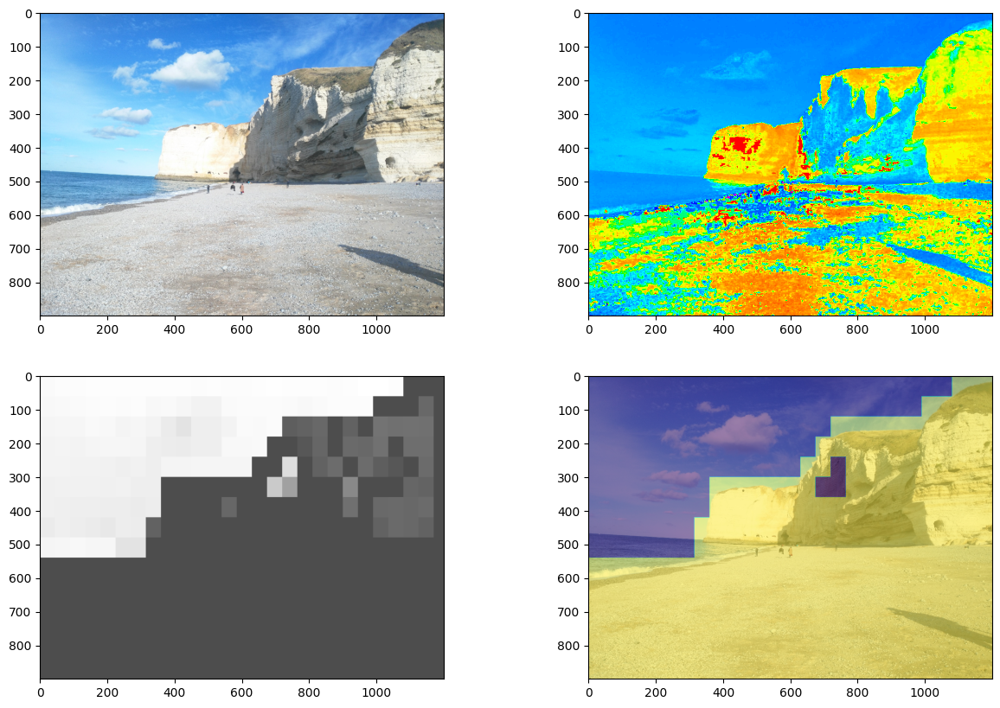

In [6]:

im = imread('etretat.jpg')
print(im.shape)
hsv = rgb2hsv(im)

def texture_descriptor(region):
    # return [sobel(region[:,:,0]).sum(), sobel(region[:,:,1]).sum(), sobel(region[:,:,2]).sum()]
    return region[:,:,0].min()  # HSV, minimum hue value
    # return region[:,:,1].max()  # HSV, maximum saturation value

# The video Way
# n_cells_x = 20
# n_cells_y = 20
# size_x = hsv.shape[1]//n_cells_x
# size_y = hsv.shape[0]//n_cells_y
# print(size_x,size_y)
#
# descriptors = np.zeros((n_cells_y,n_cells_x,3))
# for y in range(n_cells_y):
#     for x in range(n_cells_x):
#         region = hsv[y*size_y:(y+1)*size_y,x*size_x:(x+1)*size_x]
#         descriptors[y,x] = get_descr(region)
#
# ndescriptors = descriptors/descriptors.max(axis=(0,1))
#
# ref = ndescriptors[9,7]
# d = np.sqrt(((ndescriptors-ref)**2).sum(axis=2))
# d_ = resize(d, (im.shape[0],im.shape[1]), order=0, mode='reflect')
# t = threshold_otsu(d_)
# mask = d_<t

descriptor = sliding_window(hsv, (60,45))
t = threshold_otsu(descriptor)
mask = descriptor<t

def show():
    plt.figure(figsize=(15,10))
    plt.subplot(2,2,1)
    plt.imshow(im)
    plt.subplot(2,2,2)
    plt.imshow(hsv[:,:,0], cmap=plt.cm.hsv)
    plt.subplot(2,2,3)
    plt.imshow(descriptor, cmap=plt.cm.gray, alpha=0.7)
    plt.subplot(2,2,4)
    plt.imshow(im)
    plt.imshow(mask, alpha=0.5)
    plt.show()

show()

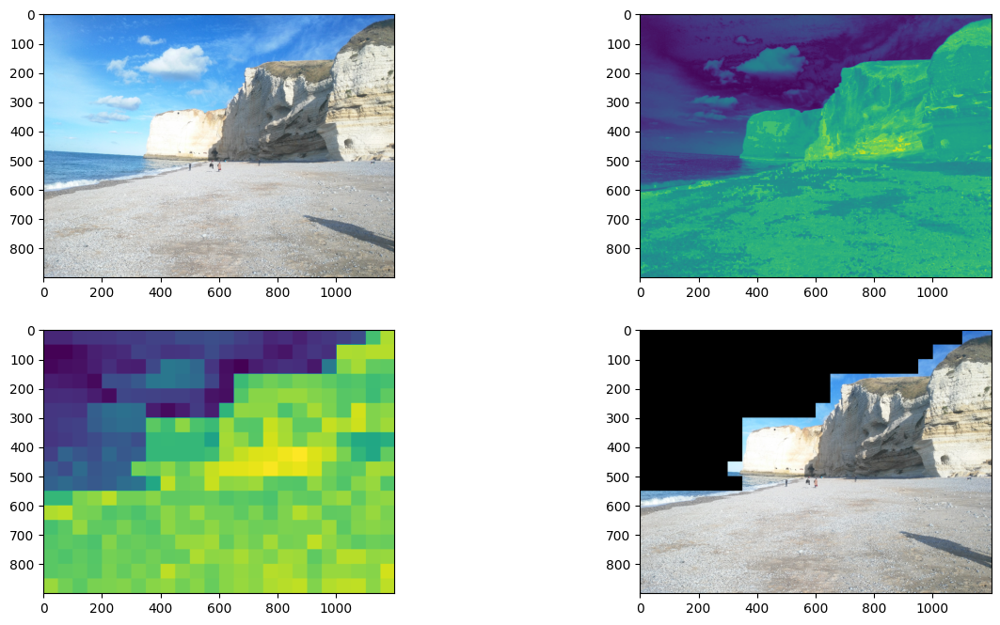

In [7]:
def texture_descriptor(N):
    e = N.max() # Replace with your descriptor
    return e

def distance_color_map(image, coords):
    refcolor = image[coords[0], coords[1]]
    dmap = np.sqrt(((image-refcolor)**2).sum(axis=2))
    return dmap

im = imread("etretat.jpg")
hsv = rgb2hsv(im)

coords = (200, 600)
dmap = distance_color_map(hsv.astype(float), coords)
h, bins = np.histogram(dmap.flatten(), bins=256)

# im_descr = sliding_window(dmap,(20,20))
im_descr = sliding_window(dmap,(50,50))
T = threshold_otsu(im_descr)
mask = im_descr>T

im_m = im.copy()
im_m[mask == False] = 0

def show():
    plt.figure(figsize=(15,8))
    plt.subplot(2,2,1)
    plt.imshow(im)
    plt.subplot(2,2,2)
    plt.imshow(dmap)
    plt.subplot(2,2,3)
    plt.imshow(im_descr)
    plt.subplot(2,2,4)
    plt.imshow(im_m)
    plt.show()

show()

Using the above example as a starting point, replace the "maximum" texture descriptor by properties from the co-occurrence matrix:
* Compute the co-occurrence matrix on the neighborhood (see [greycomatrix](http://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.greycomatrix)). Test different angles & displacements.
* Test different properties (see [greycoprops](http://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.greycoprops))

Try to segment the zebra image as best as you can using those descriptors.

**Need more help? You can check the following videos:**

* [Region descriptors](https://www.youtube.com/watch?v=5F9aPiab8PA&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=27)
* [Properties of the co-occurrence matrix](https://www.youtube.com/watch?v=NR3vrkZ9tyg&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=28)
* [Texture segmentation](https://www.youtube.com/watch?v=b-SGhLu-R0c&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=29)

## 3. Region growing

In region growing algorithms, we start from "markers" which act as seed points, and grow the segmented regions from those markers. A well-known region-growing algorithm uses the watershed transform. The example below uses the watershed transform on the cameraman image, with hand-picked markers:

(512, 512)


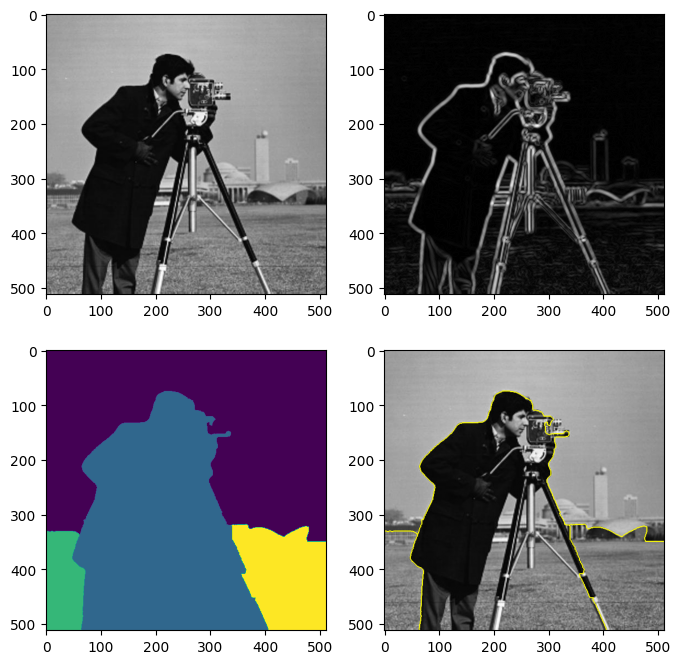

In [8]:
from skimage.morphology import disk
import skimage.filters.rank as skr
from skimage.segmentation import mark_boundaries, watershed
from skimage.io import imread

im = imread('camera.jpg')

smoothing_factor = 4
# Compute the gradients of the image:
gradient = skr.gradient(skr.mean(im, disk(smoothing_factor)), disk(1))

# Hand-picked markers for the road image
markers_coordinates = [
    [10,256], # sky
    [200,150],# cameraman
    [400,20], # grass (left)
    [400,450] # grass (right)
]

print(gradient.shape)

markers = np.zeros_like(im)
for i,(row,col) in enumerate(markers_coordinates):
    markers[row,col] = i+1

ws = watershed(gradient, markers)

plt.figure(figsize=[8,8])
plt.subplot(2,2,1)
plt.imshow(im,cmap=plt.cm.gray)
plt.subplot(2,2,2)
plt.imshow(gradient,cmap=plt.cm.gray)
plt.subplot(2,2,3)
plt.imshow(ws)
plt.subplot(2,2,4)
plt.imshow(mark_boundaries(im,ws))
plt.show()

Adapt this method to work on the road image.

Can you find a way to automatically determine the markers?

/Users/quentin/Developpement/PycharmProjects/ImageAcquisition_Labs/venv/lib/python3.9/site-packages/skimage/_shared/utils.py:348: RuntimeWarning: Images with dimensions (M, N, 3) are interpreted as 2D+RGB by default. Use `multichannel=False` to interpret as 3D image with last dimension of length 3.
  return func(*args, **kwargs)
/var/folders/4s/d117mc114zx7dd3fd3wr9xb00000gn/T/ipykernel_3568/2232480925.py:15: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  gradr = skr.gradient(im_[:,:,0],disk(5)).astype('int')
/var/folders/4s/d117mc114zx7dd3fd3wr9xb00000gn/T/ipykernel_3568/2232480925.py:16: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  gradg = skr.gradient(im_[:,:,1],disk(5)).astype('int')
/var/folders/4s/d117mc114zx

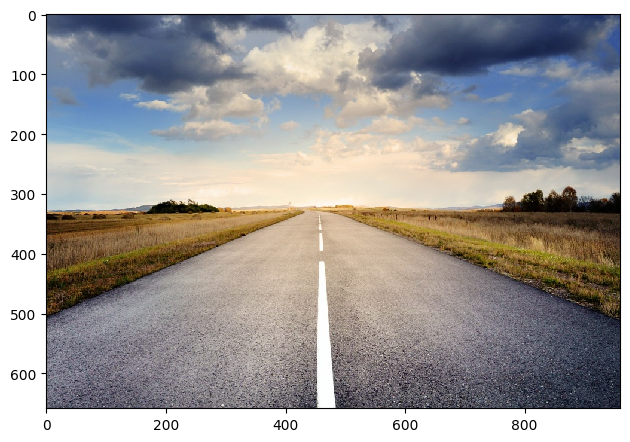

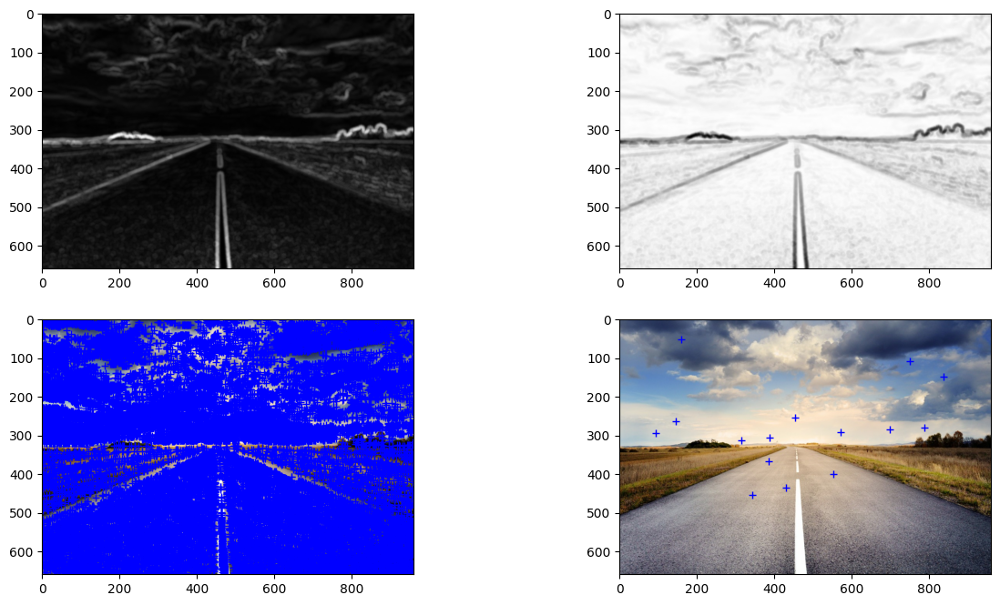

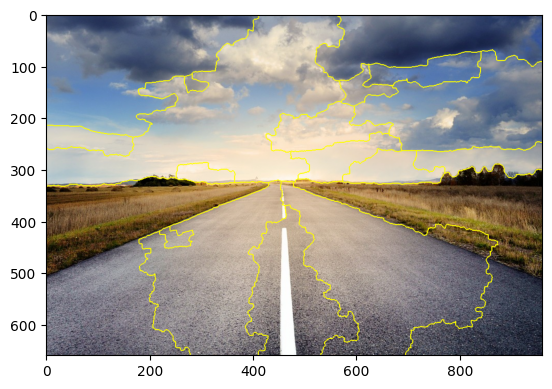

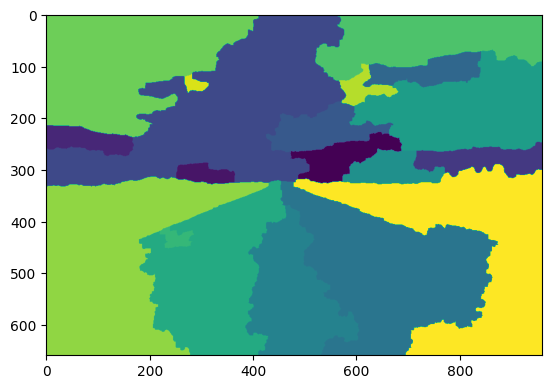

In [9]:
from skimage.filters import sobel,gaussian
from skimage.feature import peak_local_max
import skimage.filters.rank as skr
from skimage.segmentation import watershed
from skimage.segmentation import mark_boundaries
from skimage.measure import label


im = imread('road.jpg')

imshow(im)

def get_markers(im, indices=False):
    im_ = gaussian(im, sigma=2)
    gradr = skr.gradient(im_[:,:,0],disk(5)).astype('int')
    gradg = skr.gradient(im_[:,:,1],disk(5)).astype('int')
    gradb = skr.gradient(im_[:,:,2],disk(5)).astype('int')
    grad = gradr+gradg+gradb

    return peak_local_max(grad.max()-grad,threshold_rel=0.5, min_distance=60,indices=indices),grad

markers_coordinates, grad = get_markers(im, True)

markers = np.zeros_like(im)
for i,(row,col) in enumerate(markers_coordinates):
    markers[row,col] = i+1

# markers = label(markers)
ws = watershed(grad, markers[:,:,0])

def show():
    plt.figure(figsize=(15,8))
    plt.subplot(2,2,1)
    plt.imshow(grad, cmap=plt.cm.gray)
    plt.subplot(2,2,2)
    plt.imshow(grad.max()-grad, cmap=plt.cm.gray)
    plt.subplot(2,2,3)
    plt.imshow(im)
    markers = peak_local_max(grad.max()-grad)
    plt.plot(markers[:,1],markers[:,0],'b+')
    plt.subplot(2,2,4)
    plt.imshow(im)
    markers = peak_local_max(grad.max()-grad, threshold_rel=0.99, min_distance=50)
    plt.plot(markers[:,1],markers[:,0],'b+')
    plt.show()

    plt.figure()
    plt.imshow(mark_boundaries(im,ws))
    plt.figure()
    plt.imshow(ws)
    plt.show()

show()

/var/folders/4s/d117mc114zx7dd3fd3wr9xb00000gn/T/ipykernel_3568/1381192033.py:12: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  gradr = skr.gradient(im_[:,:,0],disk(5)).astype('int')
/var/folders/4s/d117mc114zx7dd3fd3wr9xb00000gn/T/ipykernel_3568/1381192033.py:13: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  gradg = skr.gradient(im_[:,:,1],disk(5)).astype('int')
/var/folders/4s/d117mc114zx7dd3fd3wr9xb00000gn/T/ipykernel_3568/1381192033.py:14: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  gradb = skr.gradient(im_[:,:,2],disk(5)).astype('int')


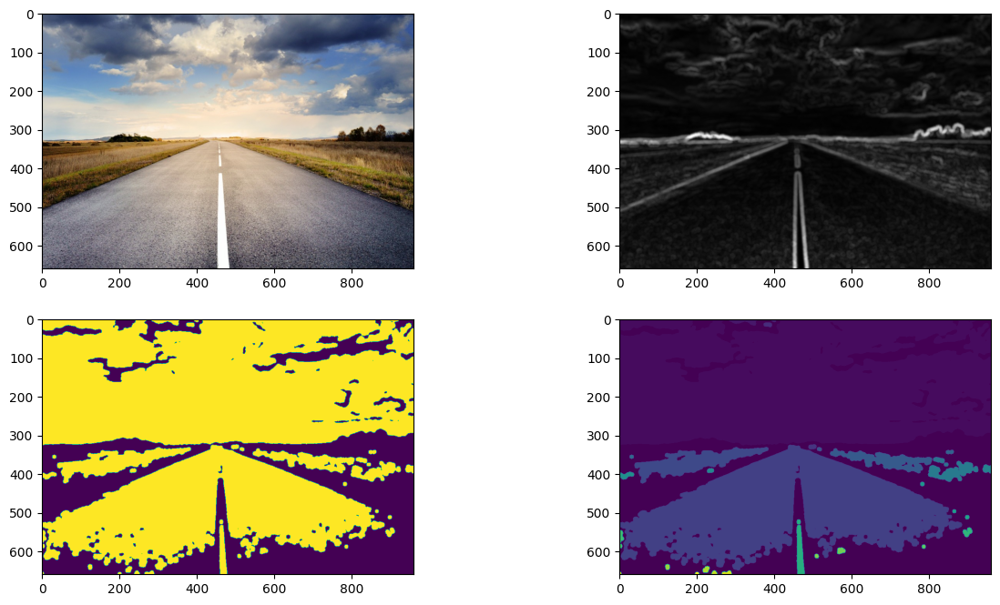

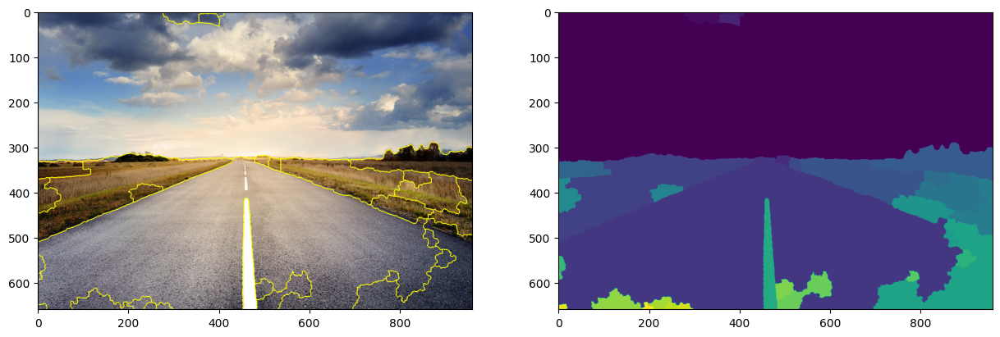

In [10]:
from skimage.filters import sobel,gaussian
from skimage.feature import peak_local_max
import skimage.filters.rank as skr
from skimage.segmentation import watershed
from skimage.segmentation import mark_boundaries
from skimage.measure import label

im = imread('road.jpg')

def get_grad(im):
    im_ = gaussian(im, sigma=2)
    gradr = skr.gradient(im_[:,:,0],disk(5)).astype('int')
    gradg = skr.gradient(im_[:,:,1],disk(5)).astype('int')
    gradb = skr.gradient(im_[:,:,2],disk(5)).astype('int')
    grad = gradr+gradg+gradb

    return grad

grad = get_grad(im)
markers = skr.minimum(im[:,:,0], disk(5)) >= grad
markers = opening(markers, disk(5))
lab = label(markers, background=0)

# markers = label(markers)
ws = watershed(grad, lab)

def show():
    plt.figure(figsize=(15,8))
    plt.subplot(2,2,1)
    plt.imshow(im, cmap=plt.cm.gray)
    plt.subplot(2,2,2)
    plt.imshow(grad, cmap=plt.cm.gray)
    plt.subplot(2,2,3)
    plt.imshow(markers)
    plt.subplot(2,2,4)
    plt.imshow(lab)
    plt.show()

    plt.figure(figsize=[15,8])
    plt.subplot(1,2,1)
    plt.imshow(mark_boundaries(im,ws))
    plt.subplot(1,2,2)
    plt.imshow(ws)
    plt.show()

show()

Another use of the watershed transform is to separate overlapping object, as in the image below.

* Compute the [distance transform](https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.distance_transform_edt.html#scipy.ndimage.distance_transform_edt) of the image.
* Use the result to automatically find good markers.
* Use the watershed transform to separate the three objects.

/var/folders/4s/d117mc114zx7dd3fd3wr9xb00000gn/T/ipykernel_3568/1820818004.py:9: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  markers_coordinates = peak_local_max(distance, min_distance=3, indices=True)


49.040799340956916


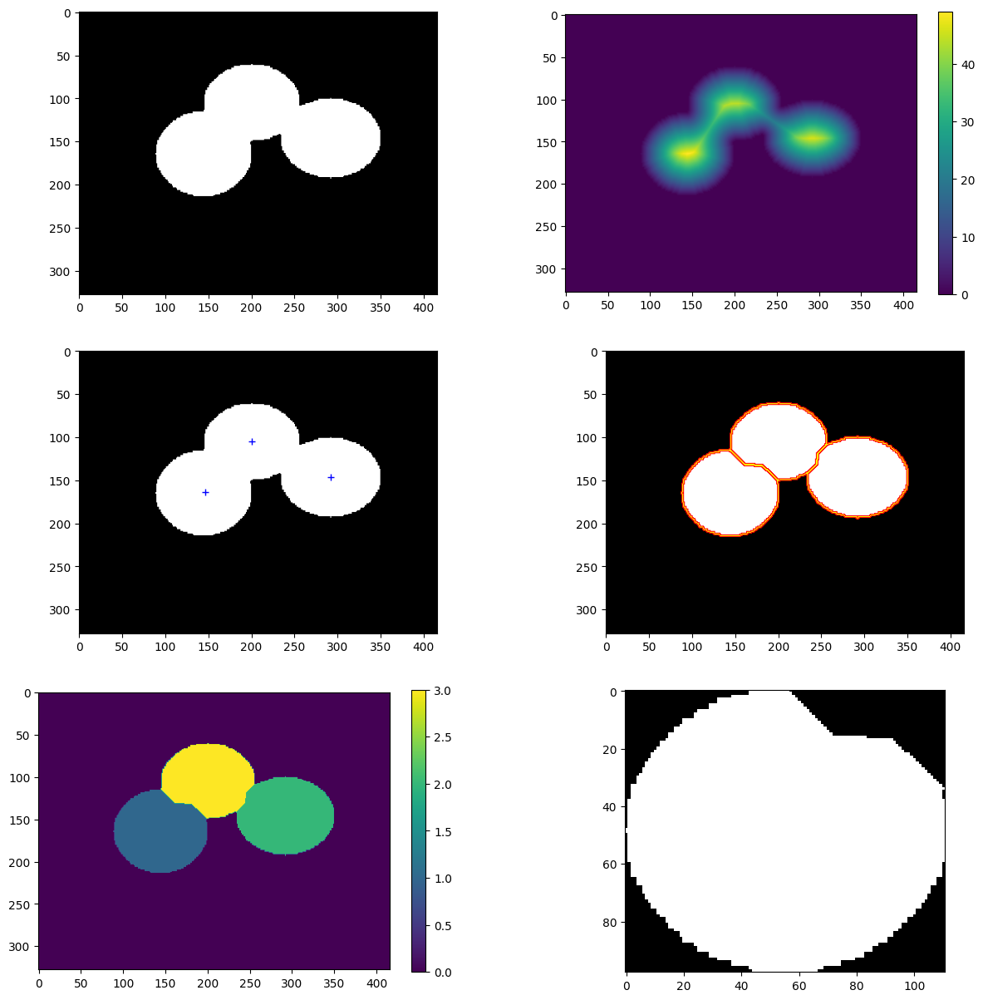

In [11]:
from scipy.ndimage import distance_transform_edt
from skimage.color import rgb2gray
from skimage.measure import label, regionprops

im = (rgb2gray(imread('separ.png'))==0).astype('uint8')
im[im == 1] = 255

distance = distance_transform_edt(im)
markers_coordinates = peak_local_max(distance, min_distance=3, indices=True)

print(distance.max())

markers = np.zeros_like(im)
for i,(row,col) in enumerate(markers_coordinates):
    markers[row,col] = i+1

ws = watershed(255-distance, markers, mask=(im>1))

def show():
    plt.figure(figsize=[15,15])
    plt.subplot(3,2,1)
    plt.imshow(im,cmap=plt.cm.gray)
    plt.subplot(3,2,2)
    plt.imshow(distance)
    plt.colorbar()
    plt.subplot(3,2,3)
    for marker in markers_coordinates:
        plt.plot(marker[1],marker[0],'b+')
    plt.imshow(im,cmap=plt.cm.gray)
    plt.subplot(3,2,4)
    plt.imshow(mark_boundaries(im, ws, outline_color=[1,0,0]))
    plt.subplot(3,2,5)
    plt.imshow(ws)
    plt.colorbar()
    plt.subplot(3,2,6)
    plt.imshow(regionprops(ws)[0].image, cmap=plt.cm.gray)
    plt.show()

show()

/var/folders/4s/d117mc114zx7dd3fd3wr9xb00000gn/T/ipykernel_3568/3810260611.py:17: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  markers_coordinates = peak_local_max(distance, min_distance=10, threshold_rel=0.2, indices=True)


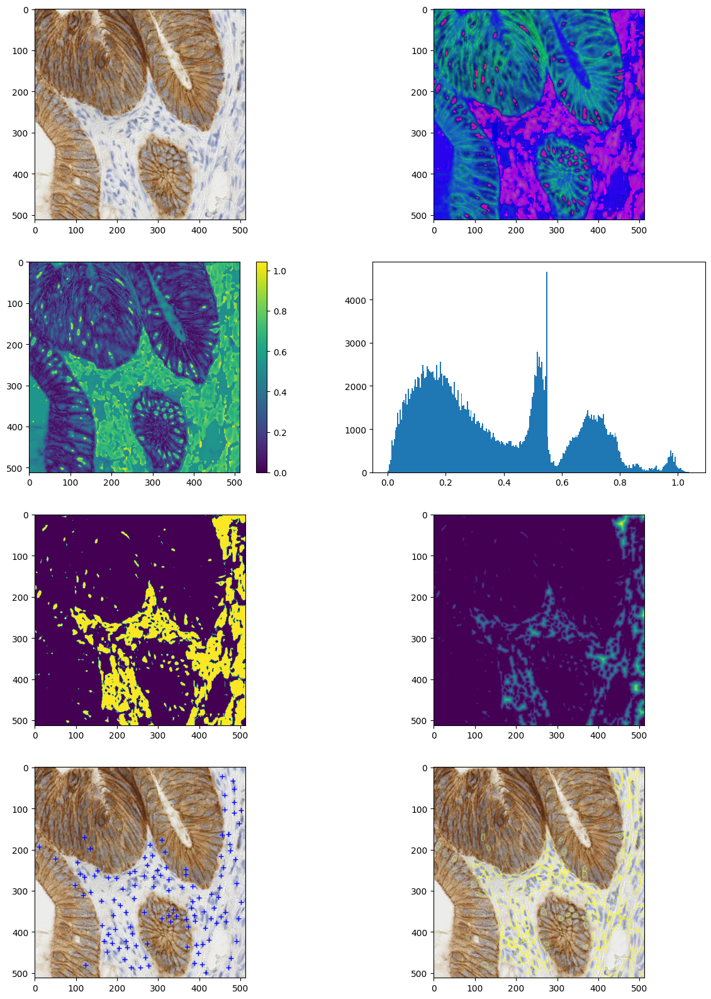

In [12]:
from skimage.data import immunohistochemistry
from skimage.color import rgb2hsv

def distance_color_map(image, coords):
    refcolor = image[coords[0], coords[1]]
    dmap = np.sqrt(((image-refcolor)**2).sum(axis=2))
    return dmap

im = immunohistochemistry()
hsv = rgb2hsv(im)

dmap = distance_color_map(hsv, (10,350))
mask = dmap>0.6
# mask = opening(closing(dmap>0.6, disk(2)),disk(2))
distance = distance_transform_edt(mask)

markers_coordinates = peak_local_max(distance, min_distance=10, threshold_rel=0.2, indices=True)

markers = np.zeros_like(dmap)
for i,(row,col) in enumerate(markers_coordinates):
    markers[row,col] = i+1

ws = watershed(dmap, markers, mask=mask)

def show():
    plt.figure(figsize=[15,20])
    plt.subplot(4,2,1)
    plt.imshow(im)
    plt.subplot(4,2,2)
    plt.imshow(hsv)
    plt.subplot(4,2,3)
    plt.imshow(dmap)
    plt.colorbar()
    plt.subplot(4,2,4)
    plt.hist(dmap.flatten(), bins=256)
    plt.subplot(4,2,5)
    plt.imshow(dmap>0.6)
    plt.subplot(4,2,6)
    plt.imshow(distance)
    plt.subplot(4,2,7)
    for marker in markers_coordinates:
        plt.plot(marker[1],marker[0],'b+')
    plt.imshow(im,cmap=plt.cm.gray)
    plt.subplot(4,2,8)
    plt.imshow(mark_boundaries(im, ws))
    plt.show()

show()

**Need more help? You can check the following videos:**

* [Markers for region growing](https://www.youtube.com/watch?v=3e0-rE9zhFk&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=30)
* [Watershed transform](https://www.youtube.com/watch?v=GuVp7dlzEKE&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=31)
* [Distance transform](https://www.youtube.com/watch?v=s1eABOdNnVg&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=32)

## 4. Object features

The next step after segmentation is often to extract object features in order to recognize, classify, or measure information about the objects.

Starting from the example below:

1. **Extract connected components** (see [label()](http://scikit-image.org/docs/dev/api/skimage.measure.html?highlight=label#skimage.measure.label)) of the shapes image and **display the centroid of the objects** (see [regionprops()](http://scikit-image.org/docs/dev/api/skimage.measure.html?highlight=regionprops#skimage.measure.regionprops))
1. For each image label, **extract the coordinates of the contour** (see [find_contours()](http://scikit-image.org/docs/dev/api/skimage.measure.html#skimage.measure.find_contours)) and **find the corners** of each objects.
1. Suggest a method to **classify the objects** in different categories.

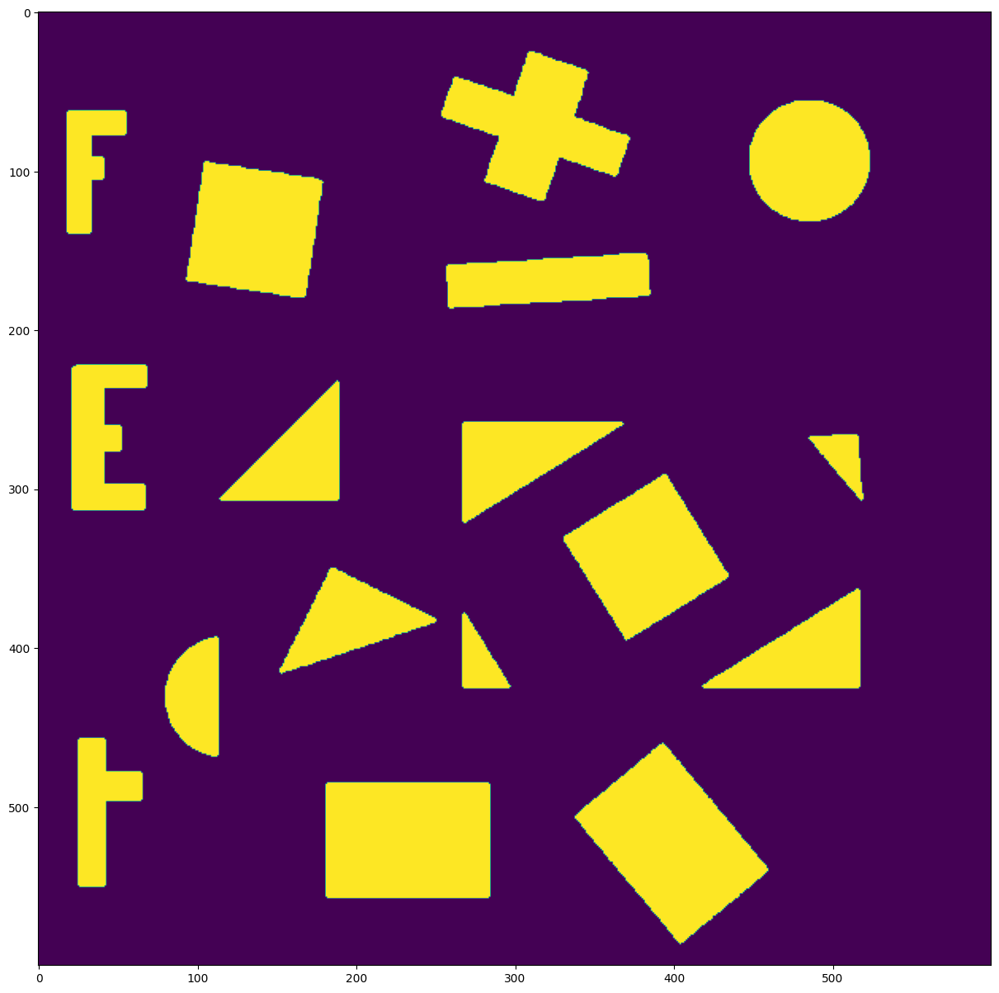

In [13]:
from skimage.measure import label, regionprops, find_contours, subdivide_polygon, approximate_polygon

im = (imread('shapes.png')[:,:,0]>0).astype(int) #binarize & cast to integer to make it easier to process later

plt.figure(figsize=(15,15))
plt.imshow(opening(im))
plt.show()

Number of elements : 17


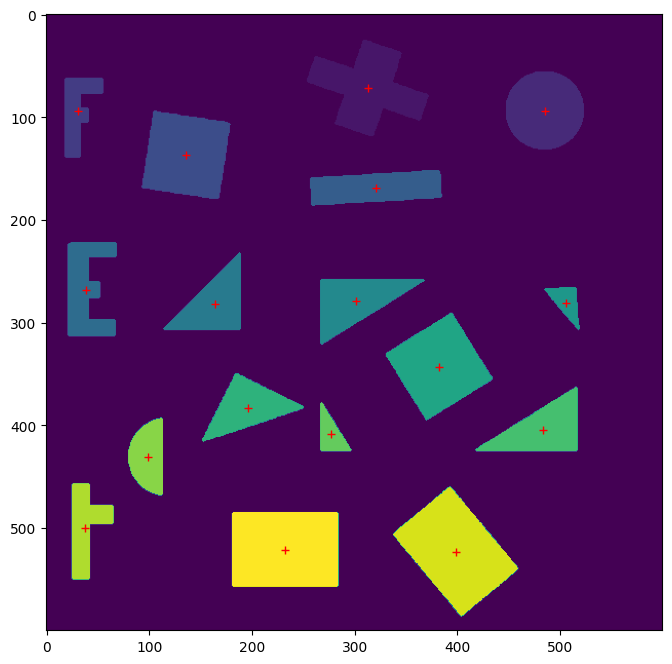

/var/folders/4s/d117mc114zx7dd3fd3wr9xb00000gn/T/ipykernel_3568/3821318908.py:27: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(5,4,i+1)


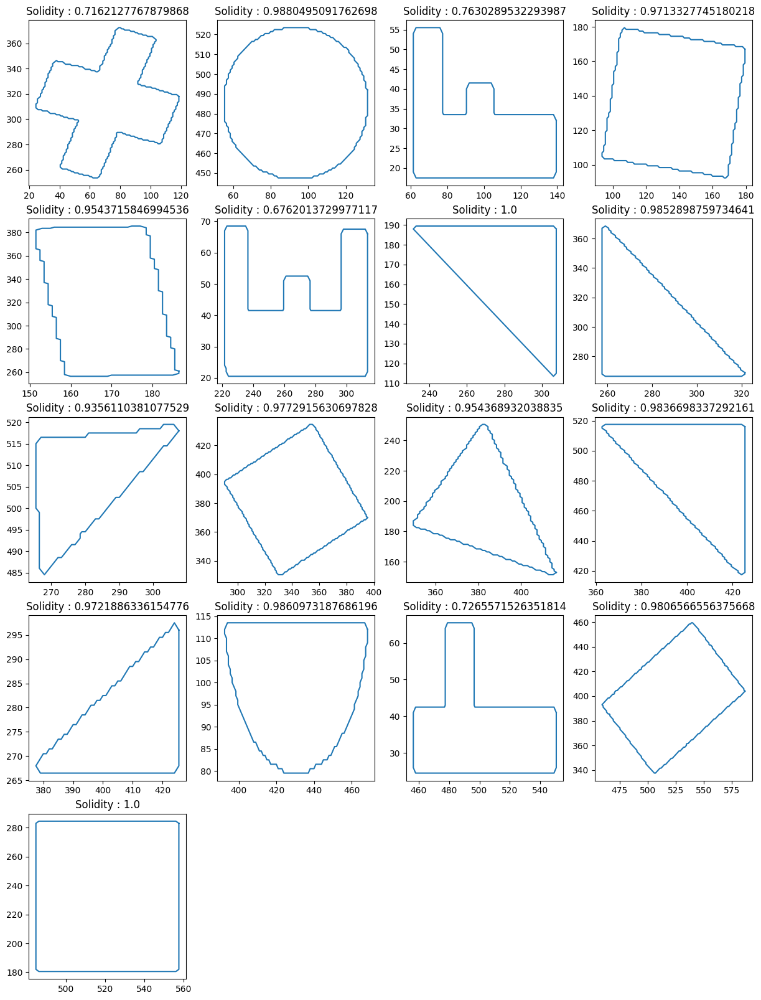

In [14]:
im = (imread('shapes.png')[:,:,0]>0).astype(int)
im = opening(im)

lab = label(im,background=0)
props = regionprops(lab)
print("Number of elements :", len(props))

# props informations :
#   - image (cropped image of the region)
#   - centroid (center of the region)
#   - solidity (ratio of pixels in the region to pixels of the convex hull image.)
#   - area (area ofthe region)

plt.figure(figsize=[8,8])
plt.imshow(lab)
for elem in props:
    centroid = elem.centroid
    plt.plot(centroid[1], centroid[0], 'r+')
plt.show()

contours = find_contours(im)

plt.figure(figsize=[15,20])
plt.imshow(lab)
for i in range(len(contours)):
    contour = contours[i].copy()
    plt.subplot(5,4,i+1)
    plt.plot(contour[:, 0], contour[:, 1])
    plt.title(f"Solidity : {props[i].solidity}")
plt.show()


**Need more help? You can check the following videos:**

* [Object labeling & features](https://www.youtube.com/watch?v=7bOH4E7c8gU&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=33)

# Coding project - Tumour segmentation

The image below is a slice of a brain MRI with a large tumour in it. The goal of this project is to create an algorithm to automatically segment the tumour.

Given that the resolution of the image is of 0.115 cm/px in both axis, estimate the area of the tumour (in cm²).

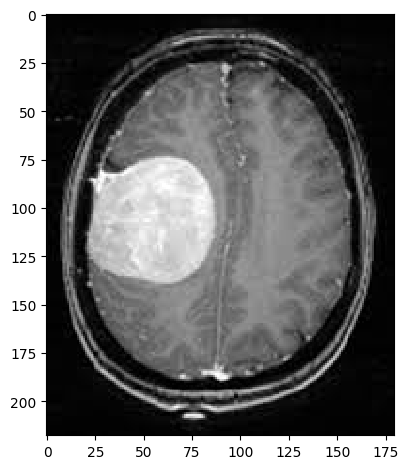

In [15]:
from skimage.io import imread,imshow
from skimage.measure import label, regionprops
%matplotlib inline

im = imread('mri_brain.jpg')
imshow(im)

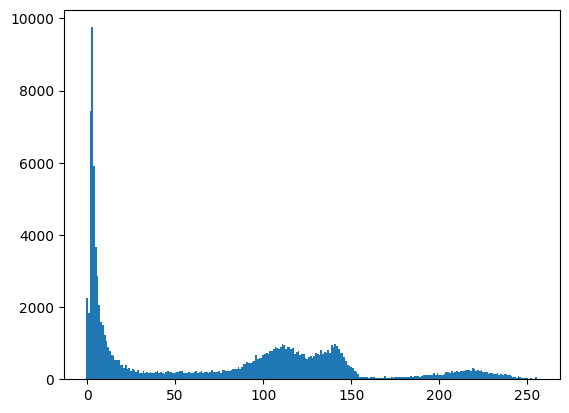

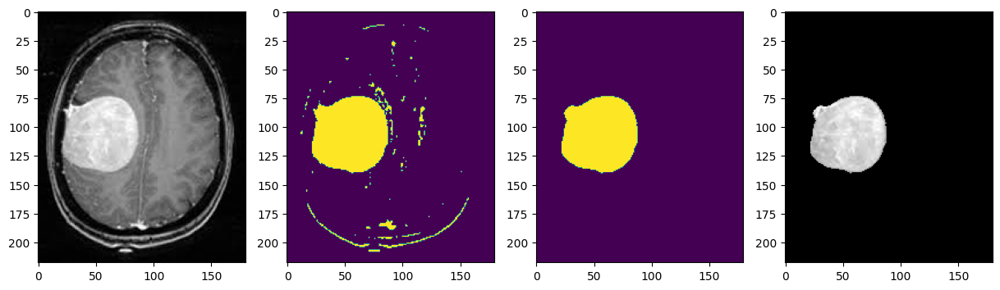

area of the tumor : 46.9223 cm2


In [16]:
from skimage.morphology import disk, rectangle, opening
from skimage.filters.edges import sobel
import skimage.filters.rank as skr
from skimage.filters import threshold_otsu
from skimage import img_as_ubyte

im = imread('mri_brain.jpg')

def compute_tumor_size(image):
    sum = 0
    for x in range(im.shape[0]):
        for y in range(im.shape[1]):
            if image[x,y] != 0:
                sum += 1

    print("area of the tumor : " + str(0.115**2 * sum) + " cm2")

# Manual Threshold
h,bins = np.histogram(im.flatten(),range(257))

threshold_im = manual_threshold(im, 150)
mask = opening(threshold_im[:,:,1],disk(4))

im_m = im.copy()
im_m[mask == False] = 0

def show():
    plt.figure()
    plt.bar(bins[:-1],h,bins[1]-bins[0])
    plt.show()

    plt.figure(figsize=(15,8))
    plt.subplot(1,4,1)
    plt.imshow(im)
    plt.subplot(1,4,2)
    plt.imshow(threshold_im[:,:,1])
    plt.subplot(1,4,3)
    plt.imshow(opening(threshold_im[:,:,1],disk(4)))
    plt.subplot(1,4,4)
    plt.imshow(im_m)
    plt.show()

    compute_tumor_size(im_m[:,:,1])

show()

/var/folders/4s/d117mc114zx7dd3fd3wr9xb00000gn/T/ipykernel_3568/3569014276.py:35: RuntimeWarning: invalid value encountered in double_scalars
  m1 = (np.arange(0,t)*h[:t]).sum()/w1


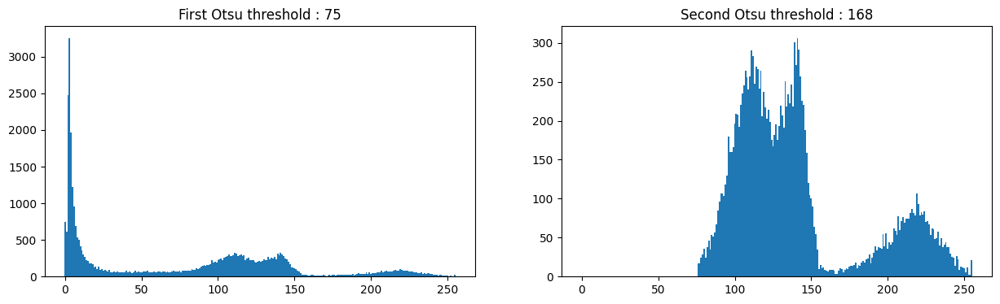

area of the tumor : 45.242725 cm2


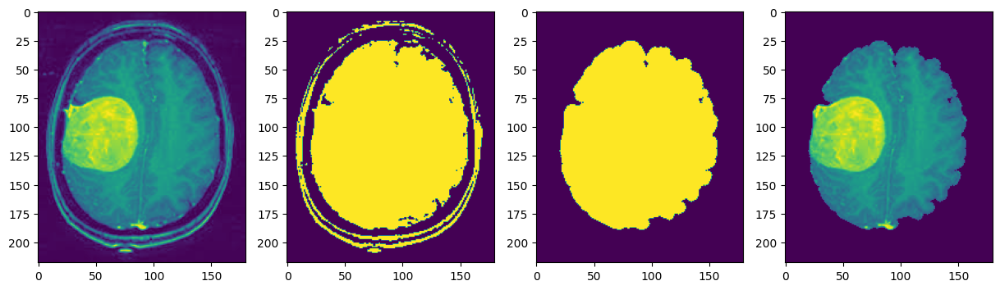

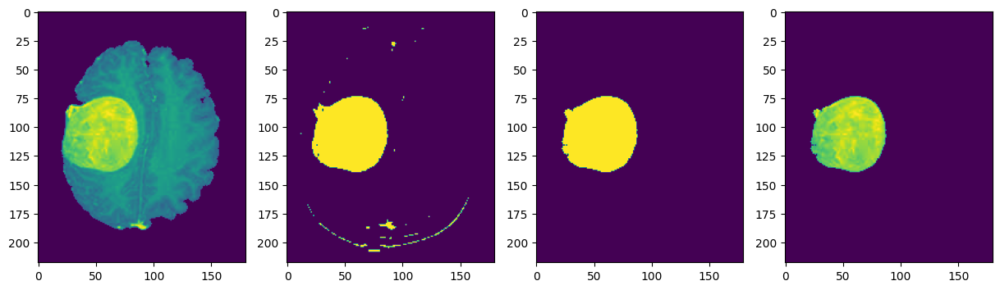

In [17]:
im = imread('mri_brain.jpg')[:,:,0]

# Double Otsu
h1,_ = np.histogram(im.flatten(),range(257))

t1,vw1,vb1,sep1 = otsu_threshold(h1)
print()
otsu_im1 = manual_threshold(im, t1)
mask1 = opening(otsu_im1,disk(4))

im_m1 = im.copy()
im_m1[mask1 == False] = 0

h2, _ = np.histogram(im_m1.flatten(),range(257))
h2[0] = 0

_, _, _,sep2 = otsu_threshold(h2)
sep2[:100] = 0
t2 = np.argmax(sep2)
otsu_im2 = manual_threshold(im, t2)
mask2 = opening(otsu_im2,disk(3))

im_m2 = im.copy()
im_m2[mask2 == False] = 0

def show():
    plt.figure(figsize=(15,4))
    plt.subplot(1,2,1)
    plt.bar(bins[:-1],h1,bins[1]-bins[0])
    plt.title(f"First Otsu threshold : {t1}")
    plt.subplot(1,2,2)
    plt.bar(bins[:-1],h2,bins[1]-bins[0])
    plt.title(f"Second Otsu threshold : {t2}")
    plt.show()

    plt.figure(figsize=(15,8))
    plt.subplot(1,4,1)
    plt.imshow(im)
    plt.subplot(1,4,2)
    plt.imshow(otsu_im1)
    plt.subplot(1,4,3)
    plt.imshow(opening(otsu_im1,disk(4)))
    plt.subplot(1,4,4)
    plt.imshow(im_m1)

    plt.figure(figsize=(15,8))
    plt.subplot(1,4,1)
    plt.imshow(im_m1)
    plt.subplot(1,4,2)
    plt.imshow(otsu_im2)
    plt.subplot(1,4,3)
    plt.imshow(opening(otsu_im2,disk(3)))
    plt.subplot(1,4,4)
    plt.imshow(im_m2)

    compute_tumor_size(im_m2)

show()

/Users/quentin/Developpement/PycharmProjects/ImageAcquisition_Labs/venv/lib/python3.9/site-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


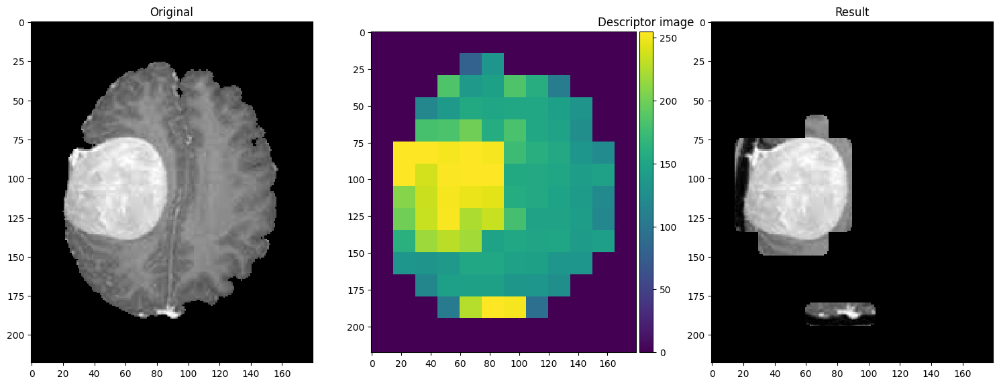

In [18]:
im = imread('mri_brain.jpg')[:,:,0]

# Remove Skull
h1,_ = np.histogram(im.flatten(),range(257))
t1, _, _, _ = otsu_threshold(h1)

mask = opening(manual_threshold(im, t1), disk(4))

im_m = im.copy()
im_m[mask == False] = 0

# Region descriptor
def texture_descriptor(N):
    e = N.max()
    return e

def sliding_window(im, PATCH_SIZE):
    output = np.zeros((im.shape[0], im.shape[1]))
    for i in range(0, im.shape[0] - PATCH_SIZE[0] + 1, PATCH_SIZE[0]):
        for j in range(0, im.shape[1] - PATCH_SIZE[1] + 1, PATCH_SIZE[1]):
            patch = im[i:i + PATCH_SIZE[0], j:j + PATCH_SIZE[1]]
            output[i:i + PATCH_SIZE[0], j:j + PATCH_SIZE[1]] = texture_descriptor(patch)
    return output

region_size = 15
im_descr = sliding_window(im_m, (region_size, region_size))

threshold_im = manual_threshold(im_descr, 185)
mask1 = opening(threshold_im, disk(3))

def show():
    plt.figure(figsize=(15,8))
    plt.subplot(1,3,1)
    imshow(im_m1)
    plt.title('Original')
    plt.subplot(1,3,2)
    imshow(im_descr)
    plt.title('Descriptor image')
    plt.subplot(1,3,3)
    imshow(im*mask1)
    plt.title('Result')
    plt.show()

show()

/var/folders/4s/d117mc114zx7dd3fd3wr9xb00000gn/T/ipykernel_3568/2616683743.py:17: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  markers_coordinates = peak_local_max(gradient.max()-gradient,threshold_rel=0.1, min_distance=30,indices=True)


(218, 180)
46.142025000000004
area of the tumor : 46.142025000000004 cm2
None


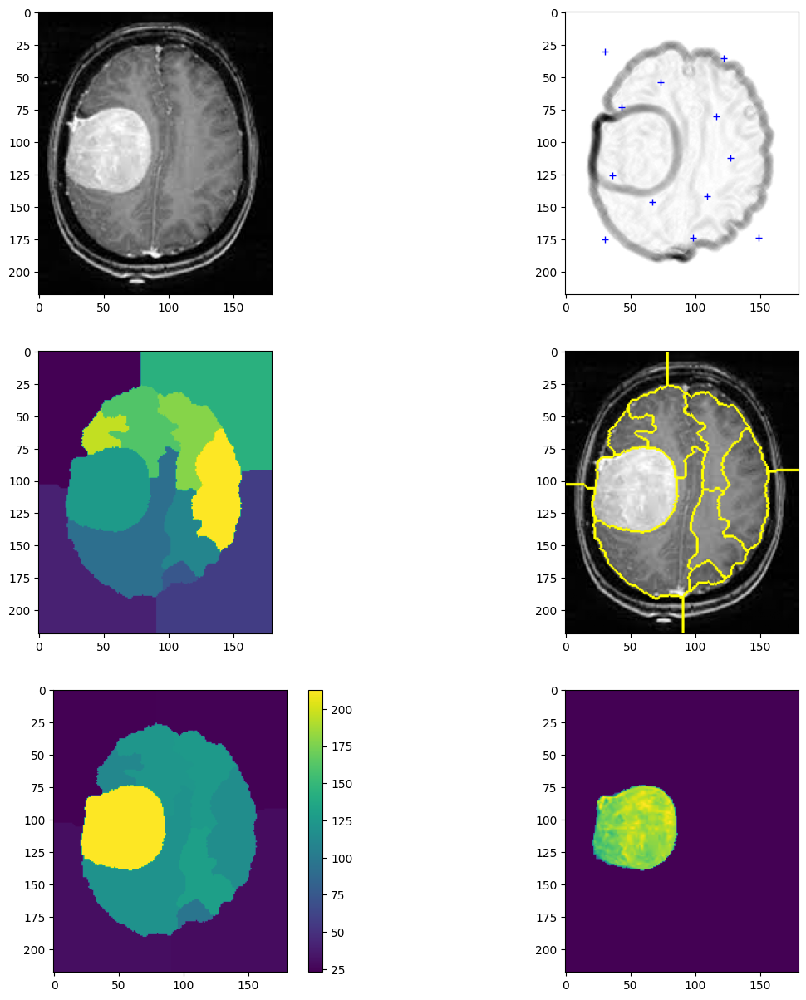

In [19]:
im = imread('mri_brain.jpg')[:,:,0]

# Watershed Transform

# Remove Skull
h1,_ = np.histogram(im.flatten(),range(257))
t1, _, _, _ = otsu_threshold(h1)

mask = opening(manual_threshold(im, t1), disk(4))

im_m = im.copy()
im_m[mask == False] = 0

smoothing_factor = 4
# Compute the gradients of the image:
gradient = skr.gradient(skr.mean(im_m, disk(smoothing_factor)), disk(1))
markers_coordinates = peak_local_max(gradient.max()-gradient,threshold_rel=0.1, min_distance=30,indices=True)

# markers_coordinates = [
#     [25,25],      # background
#     [50,100],     # tumor
#     [125,125]     # brain
# ]

markers = np.zeros_like(im)
for i,(row,col) in enumerate(markers_coordinates):
    markers[row,col] = i+1

ws = watershed(gradient, markers)

# Reduce possible oversampling (using mosaic)
def get_descriptor(region):
    return region.mean()

descriptors = np.zeros(ws.max()+1)
im_descriptors = np.zeros_like(im)
print(im_descriptors.shape)

for i in range(ws.min(),ws.max()+1):
    descriptors[i] = get_descriptor(im[ws==i])
    im_descriptors[ws==i] = descriptors[i]

mask = im_descriptors>150

# Retrieve the tumor as a region prop
lab = label(mask)  # label of mask, only the tumor left
props = regionprops(lab)

# Compute tumor size
print(props[0].area*(0.115**2))
print(compute_tumor_size(im*mask))

def show():
    plt.figure(figsize=[15,15])
    plt.subplot(3,2,1)
    plt.imshow(im,cmap=plt.cm.gray)
    plt.subplot(3,2,2)
    for marker in markers_coordinates:
        plt.plot(marker[1],marker[0],'b+')
    plt.imshow(gradient.max()-gradient,cmap=plt.cm.gray)
    plt.subplot(3,2,3)
    plt.imshow(ws)
    plt.subplot(3,2,4)
    plt.imshow(mark_boundaries(im,ws))
    plt.subplot(3,2,5)
    plt.imshow(im_descriptors)
    plt.colorbar()
    plt.subplot(3,2,6)
    plt.imshow(im*mask)
    plt.show()

show()

(218, 180)


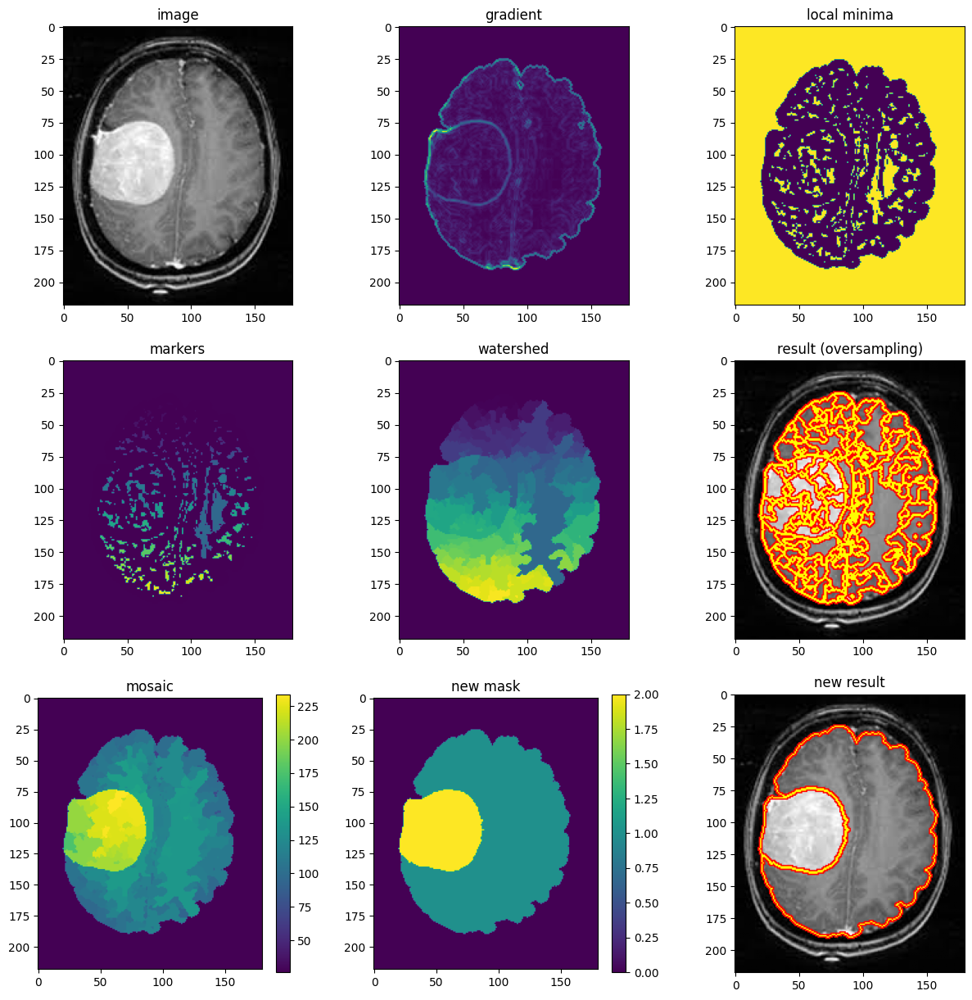

In [20]:
im = imread('mri_brain.jpg')[:,:,0]

# Remove Skull
h1,_ = np.histogram(im.flatten(),range(257))
t1, _, _, _ = otsu_threshold(h1)

mask = opening(manual_threshold(im, t1), disk(4))

im_m = im.copy()
im_m[mask == False] = 0

# Watershed on local minima
grad = skr.gradient(im_m, disk(1))
mark = (skr.minimum(im_m, disk(5)) + 10 >= im_m).astype(np.uint8)

lab = label(mark, background=0)
ws = watershed(grad, lab)

result = mark_boundaries(im,ws,outline_color=[1,0,0])

# Diminish over-segmentation (mosaic)
def get_descriptor(region):
    return region.mean()

descriptors = np.zeros(ws.max()+1)
im_descriptors = np.zeros_like(im)
print(im_descriptors.shape)

for i in range(ws.min(),ws.max()+1):
    descriptors[i] = get_descriptor(im[ws==i])
    im_descriptors[ws==i] = descriptors[i]

mask_tumor = im_descriptors>150
mask_brain = im_descriptors>50

def show():
    plt.figure(figsize=[15,15])
    plt.subplot(3,3,1)
    plt.imshow(im,cmap=plt.cm.gray)
    plt.title('image')
    plt.subplot(3,3,2)
    plt.imshow(grad)
    plt.title('gradient')
    plt.subplot(3,3,3)
    plt.imshow(mark)
    plt.title('local minima')
    plt.subplot(3,3,4)
    plt.imshow(lab)
    plt.title('markers')
    plt.subplot(3,3,5)
    plt.imshow(ws)
    plt.title('watershed')
    plt.subplot(3,3,6)
    plt.imshow(result)
    plt.title('result (oversampling)')
    plt.subplot(3,3,7)
    plt.imshow(im_descriptors)
    plt.title('mosaic')
    plt.colorbar()
    plt.subplot(3,3,8)
    plt.imshow(1.*mask_tumor + mask_brain)
    plt.colorbar()
    plt.title('new mask')
    plt.subplot(3,3,9)
    plt.imshow(mark_boundaries(im, (1.*mask_tumor + mask_brain).astype('uint8'), outline_color=[1,0,0]))
    plt.title('new result')

show()